
# Part 1: Introduction

### [Author: John (Jack) Messerly](https://www.linkedin.com/in/jack-messerly-567b9b96/)
### [Main Project Page](https://messy-bytes.github.io/Advanced-ML-Color-Fixes/)

<br>

This first post gives an overview of color enhancement for machine learning engineers who may have not worked in rigorous Image Quality Assessment. We'll go over basic color temperature, as well as more complex distortions such as:

1. Intense artificial light sources
2. Mixed-colored lighting

I have included a gallery of images that I retouched with my VAE denoising framework. These images were not part of the network's training set and all received the same treatment. More about this process can be found in [later on in this post](https://messy-bytes.github.io/Advanced-ML-Color-Fixes/2023/05/05/P3.html), but the most challenging aspect of this project was [building a diverse dataset](https://messy-bytes.github.io/Advanced-ML-Color-Fixes/2023/05/03/P2.html) that could address the complex lighting distortions I wanted to fix. These images require a complex dataset to account for their intense distortions, and there aren't many readily available datasets that portray these issues. 

<br>

### A Note on State-of-the-Art Comparisons

Although I didn't use any research papers for comparison, I think my work stands on its own. I concentrated on a challenging test set that consisted of neon and disco light scenes, which are difficult to neutralize even with Photoshop tools. I couldn't really find a recent academic paper on image enhancement that shared their code, test set, and weights, and addressed the same issue as mine (mixed-colored artificial lighting). I did find other hobbyst Github accounts to compare myself to, but it felt strange writing about their algorithms here. Instead, I compared my findings to a basic "gray balance" algorithm. 

<br>


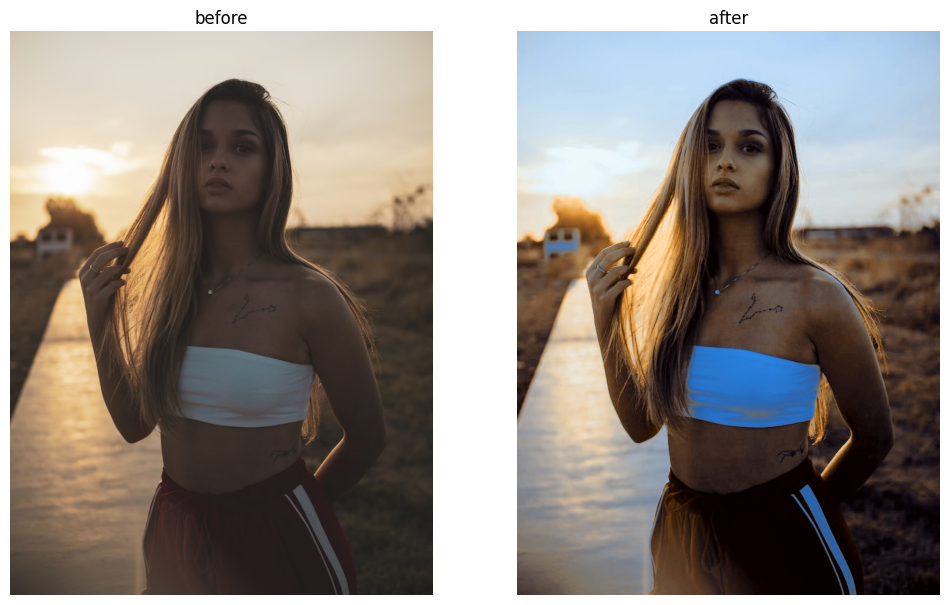

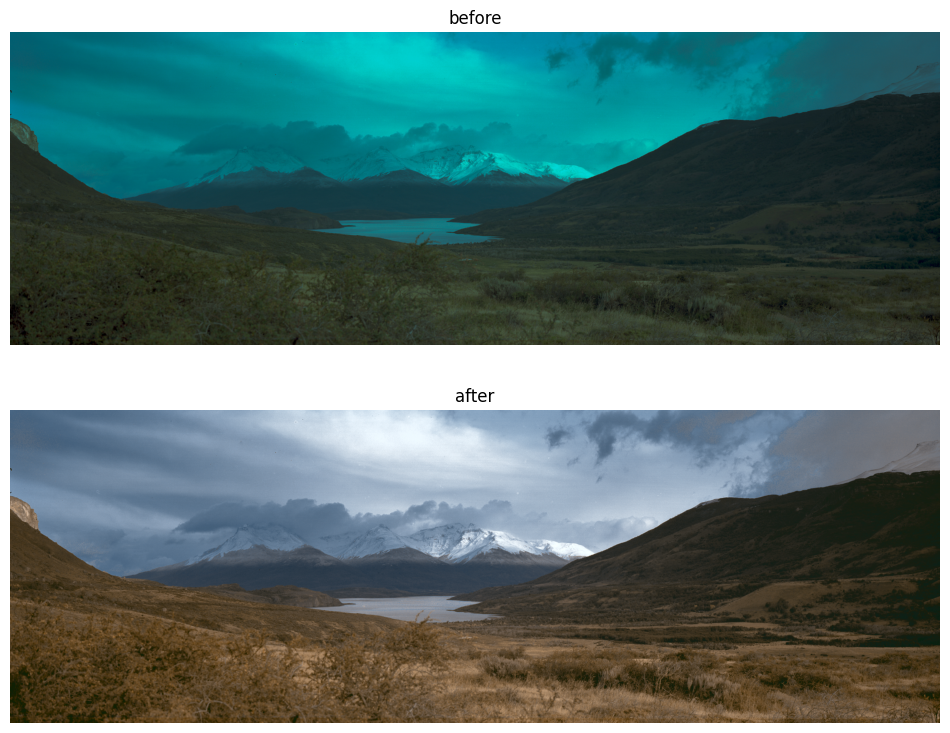

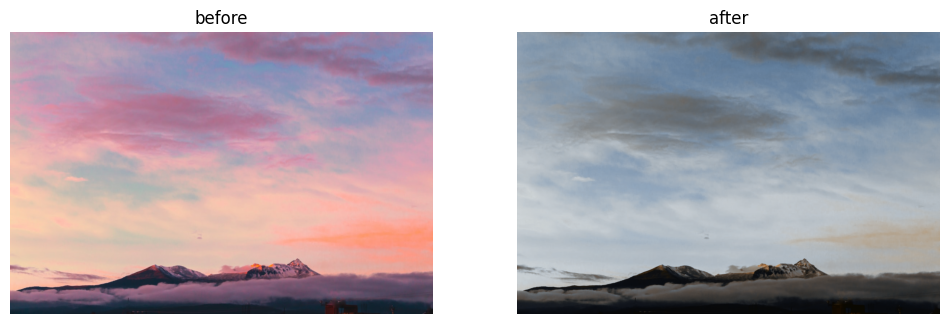

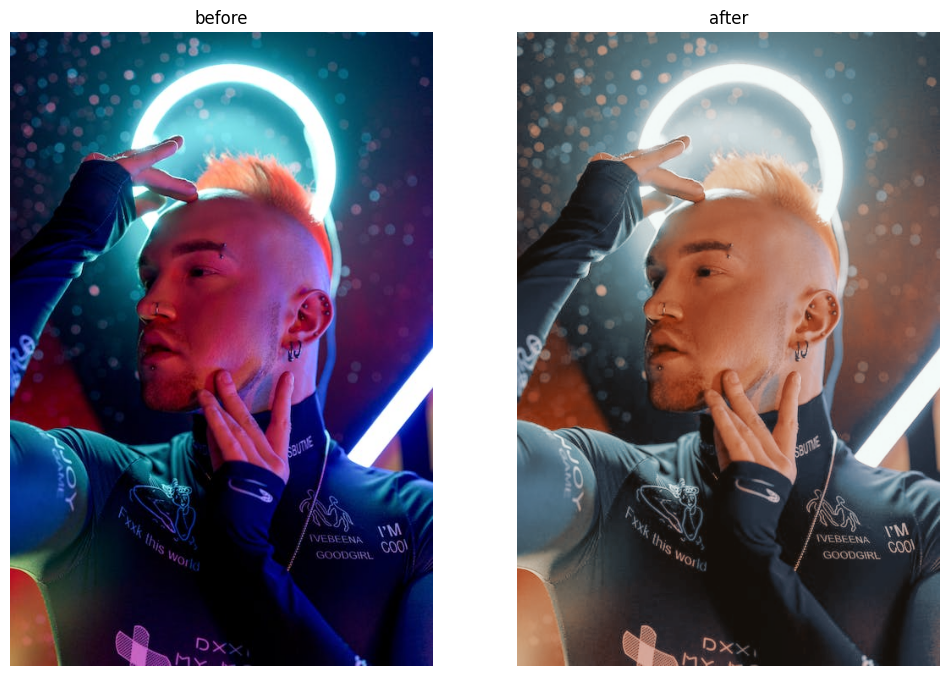

# The State of Image Enhancement

I am a camera engineer who spends a lot of time working on high resolution images. I work on a range of computer vision subjects, but my favorite subject in all of image science is color. Color enhancement is fun to work on because of the large amount of well-designed photoshop tools out there. I am a drab, data-oriented python developer, but for a few hours a day, I can open GIMP and feel like I am an artist. I am always humbled by the amount of image processing expertise there is in the movie, game and animation fields, and I like to haunt their subreddits to learn more about color spaces, image correction, and aesthetics. We computer vision engineers are really just guests in their world.

On the machine learning side, color enhancement isn’t as tedious as image classification or feature matching. For one, the machine learning part is kind of easy (uncomplicated architectures will solve this problem). And even if your pipeline isn’t perfect, you are still rewarded by looking at beautiful images all day. Computational photography datasets tend to be high resolution, with vivid colors and diverse subject matters. Although I love robotics as a field, looking at poorly exposed PrimeSense stereo pairs isn’t quite as fulfilling as flipping through peoples’ vacation photos. Color theory is also surprisingly well-founded in both mathematics, and psychology.

## Focus, Color and Exposure

You can really divide image enhancement into 3 categories: focus, color and exposure. Algorithms that perfect these areas are called "3A algorithms", where "A" stands for "Automatic". 

1. __Focus__: sharpness enhancement, autofocus, upscaling, bokeh
2. __Color__: white balance, tone mapping
3. __Exposure__: black level correction, high-dynamic range imaging

Large companies like Google, Facebook, Qualcomm and Samsung hire many algorithm engineers to work on perfecting these pipelines for smartphone cameras, VR headsets and car cameras. This was my first job out of school, before moving on to a more pure computer vision role. Focus enhancement doesn't use much machine learning. For real world photographs, you generally don't need it: the sensor level algorithms are good, and the resolution of the photo is actually downsampled before being turned into the final image. However, upscaling is a big topic in AI art generation (which usually works with autoencoder compressed images). Something that I've also picked up from Linkedin spam over the last few years is that using machine learning to create an "out of focus" artistic effect (called bokeh) is having a moment right now.

Color and exposure are where a lot of photograph image enhancement actually happens. As it is mostly a human perception problem, and a very data oriented one at that, machine learning has always been a main tool in these areas. And in the center of color / exposure balancing is the Fully Convolutional Network (FCN), such as Unet. When you have a good labeled dataset, an FCN and a simple loss function like MSE or Binary Cross Entropy (BCE) will get you through most color and exposure fixing problems. When you don't have a lot of labeled data, things become a little more complicated. You can rely on GANs and something called "unpaired loss", which we will cover in an addendum to this project. Today, we will be looking at neutralizing harsh colors and exposure problems in real world photographs using supervised learning.







# Color Balance

To clarify some terms, "color balance" refers to the adjustment of the "color temperature" of natural or artificial light in a scene, as it can affect the color quality of the image. This effect is often described as "warm lighting" or "cool lighting" by normal people, but it's more fun to use fancier terms such as "fluorescent," "incandescent," or "tungsten." Removing this color bias helps to "balance" the image. The images you take on your phone have likely already undergone a lot of balancing work, and it's probably rare that you ever encounter a truly imbalanced photo in 2023. If you're not familiar with color temperature, I recommend reading the Wikipedia article on the subject, as it's clear and free of advertisements, unlike many websites and blogs.

[https://en.wikipedia.org/wiki/Color_balance](https://en.wikipedia.org/wiki/Color_balance)


The woman in the picture is holding a "ColorChecker" chart which is a foam chart with precise paint used to calibrate camera colors. These charts can be quite expensive. The simplest color balance algorithms locate a white area on the chart and use it to adjust the entire image. If you don't have a ColorChecker chart, you can assume that the colors in your image should average out to gray and balance based on that. To learn more about this method, search for the "gray world" assumption online.

By 2023, most cameras will have software that automatically corrects common issues. However, toy cameras for Raspberry Pi and certain robotics cameras may not be optimized for the general public and can only remove basic distortions. Unless your phone is subjected to extreme damage, the photos you take are unlikely to have errors that can be fixed with these simple algorithms.


### White Balancing Girl from Wikipedia, Before and After Gallery

Below is a result of my network being applied to an image of a girl holding a classic ColorChecker.

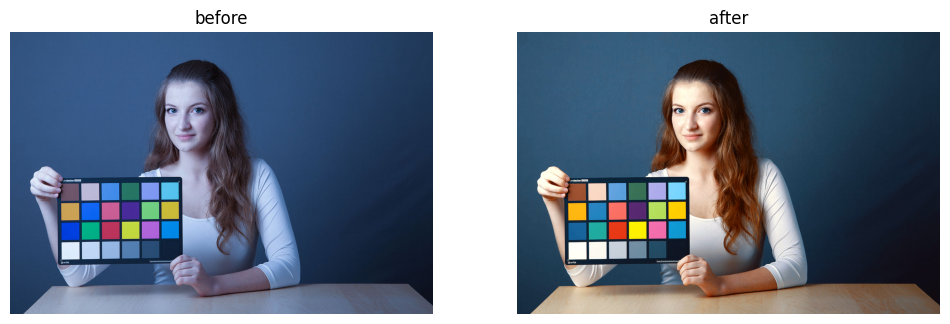

My network has passed a basic color balancing test, which is good news. Next, we will test a simple "gray world assumption" algorithm.

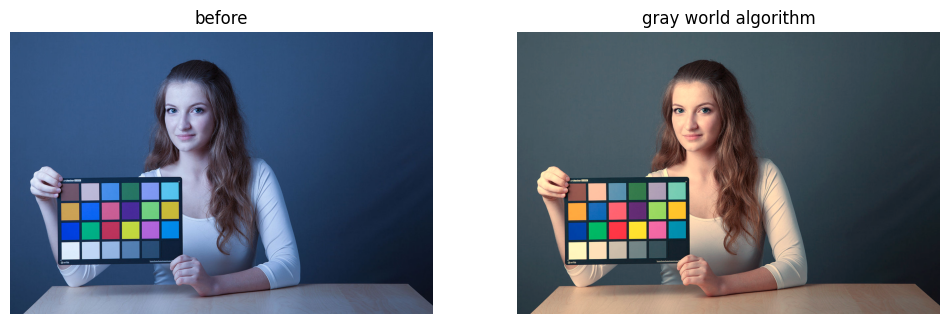

Also good, but her shirt and the white tile on the ColorChecker aren't as white as they could be. So, who wins this round? Below I've posted ground truth, which is taken by actually using the ColorChecker chart to divide out the bad lighting. Overall, I have to admit that the gray world algorithm does better here. Although my neural network can make the whites really pop, it does "too good" of a job: it makes her hair more vivid, and her eyes a deeper blue. My network also makes the background blue, something that the simple gray world algorithm didn't get tricked by. This is the caveat of using machine learning to solve these problems: sometimes your network will invent colors or textures that aren't actually there. That being said, there are many examples where machine learning will greatly outperform any other solution. The gray world algorithm does extremely well in this image because the colors basically average out to gray: they selected a gray background for a reason. But in real photographs, that is almost never the case.

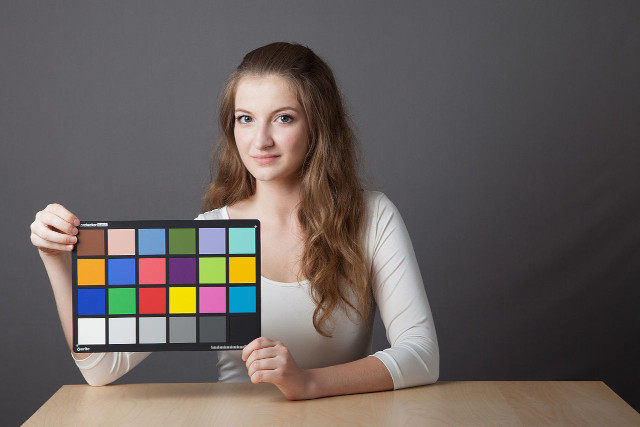

### When Simple White Balance Fails

Even if your image has simple "topical" color issues, auto white balance algorithms can still fail if the distribution of the colors in your image isn't varied enough. The simplest white balance algorithms just choose your gray point as the mean color value, while more advanced color balance algorithms pick gray points from lookup tables based on image content. Here are some simple color correction cases where the gray world algorithm fails, by chance of the distortion being too harsh, or if the underlying color distribution is that is biased, or uneven.



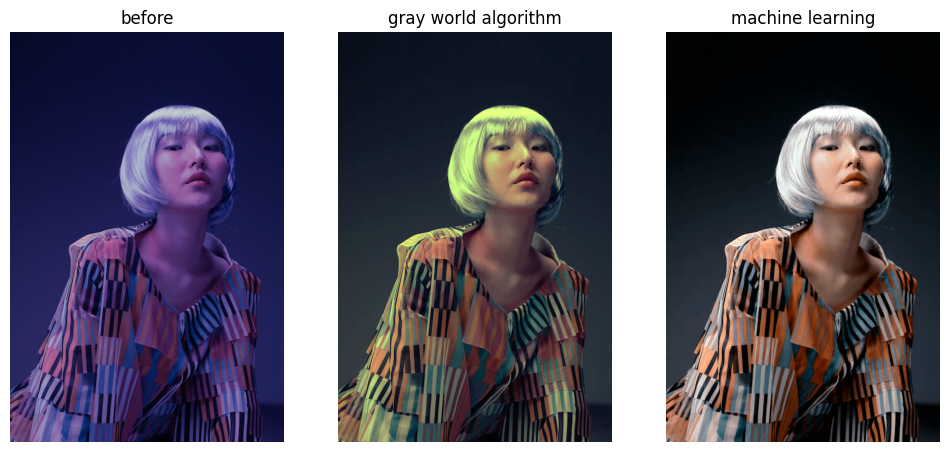

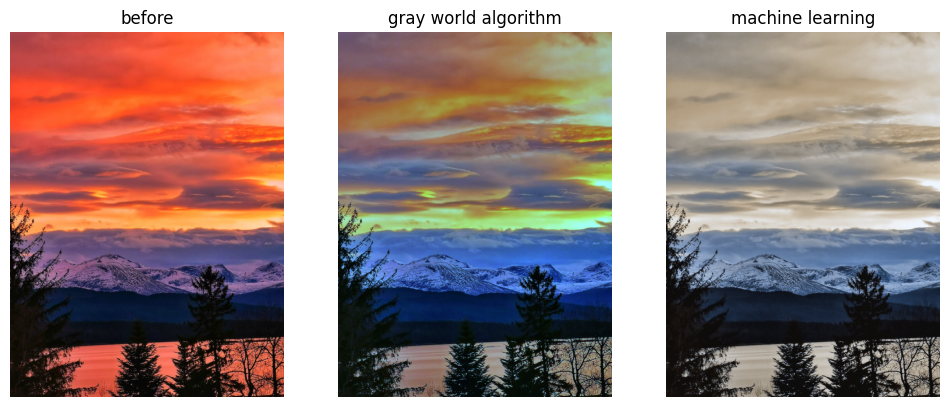

### Mixed + Harsh Colorful Lighting

In the above examples, the gray world algorithm fails because the colored lighting is too intense, or because the underlying image doesn't average out to gray. These images were still "simple" because there was only one color causing an imperfection: the portrait of the girl had excess purple lighting, while the sunset had excess orange. In the real world, we see all kinds of crazy color distortions, especially in images with multiple artificial light sources. Multiplying or subtracting out a scalar isn't enough to neutralize these images because these color/exposure imperfections affect the image on a local level. The closer a texture is to a source, the more intense the distortion will be in that isolated area.

1. The first image displays a girl sitting on the floor of a roller-skating rink, surrounded by rainbow lighting. Her face appears purple, while the illumination on her jeans and the red spotlight on the floor makes them appear green and red respectively. The colored lighting creates specular highlights and changes the color of the object surfaces. However, there is no "global color bias" affecting the image. To neutralize the image, we need to eliminate all the colored lights and their impact on object surfaces. While gray world algorithms are ineffective in achieving this, machine learning can determine what normal lighting would look like.

2. The second image in the set below is an alley with neon highlights. Similarly, if we wanted to render this image as if it were a "boring, regular" city at night, we would need a machine learning model that has been trained on these kinds of lighting distortions.

3. And finally the third image, which has a mix of red, green, and blue lighting imbalances, as well as being underexposed and oversaturated. It is a very complex image to render neutral, but fortunately, our algorithm does a good job.

As a side note, there are lots of great images from certain video games and movies I'd love to show off here, but unfortunately, I'm limited to free images without copyright restrictions.

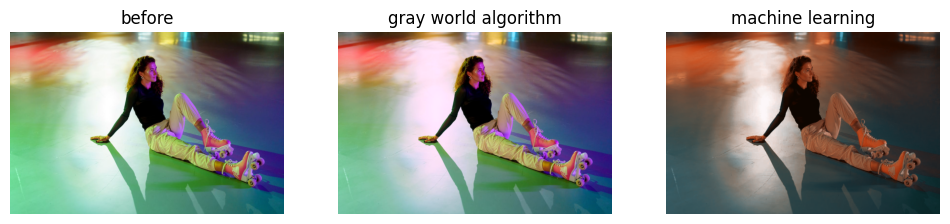

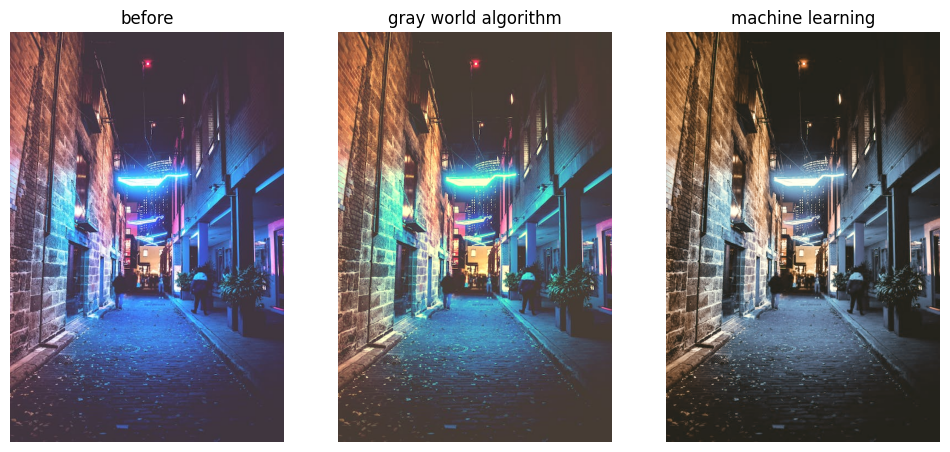

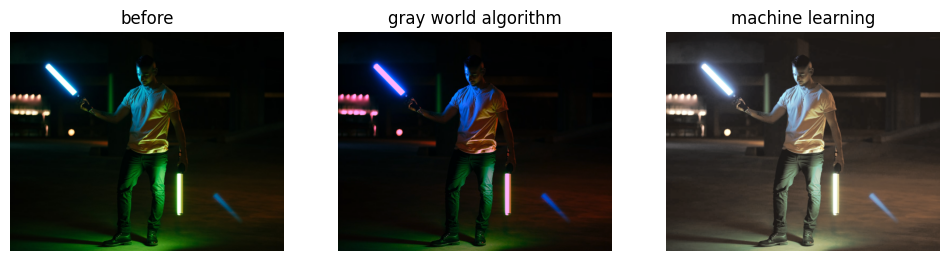

### Intense Highlights

This has been shown off in the previous images, but I wanted to reiterate the problem of intense highlights in fixing colors. Really intense, focused light can oversaturate a certain region of an image with a single color, and these patches are not easy to get rid of without designing a dataset that specifically learns to remove colors that affect an image this way. 

I think out of all the areas of color balance, this is the hardest because the presence of saturating highlights destroys any information about the true underlying color. I did pretty good but there's definitely some room for improvement. A dataset that can properly identify this issue would have distortions to actual hue (particularly the hue of faces).



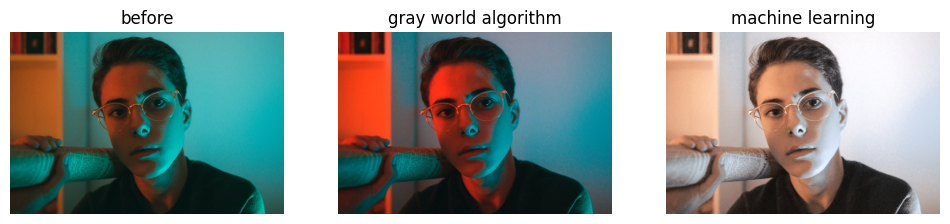

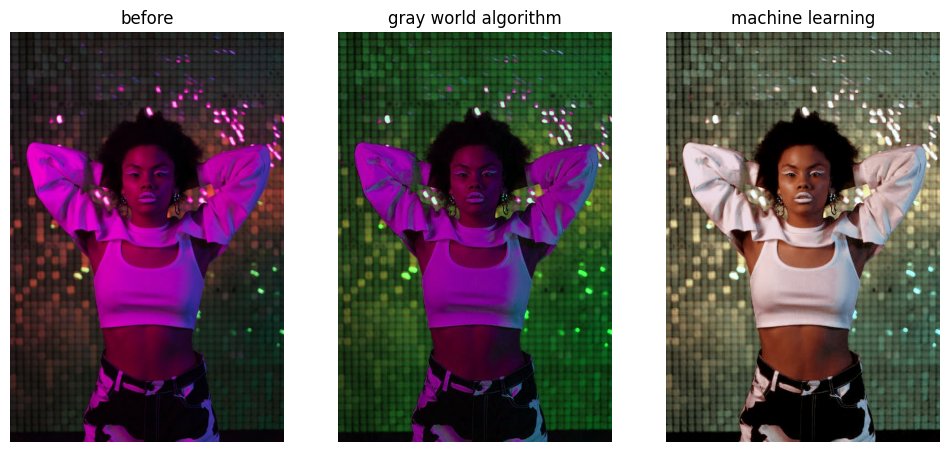

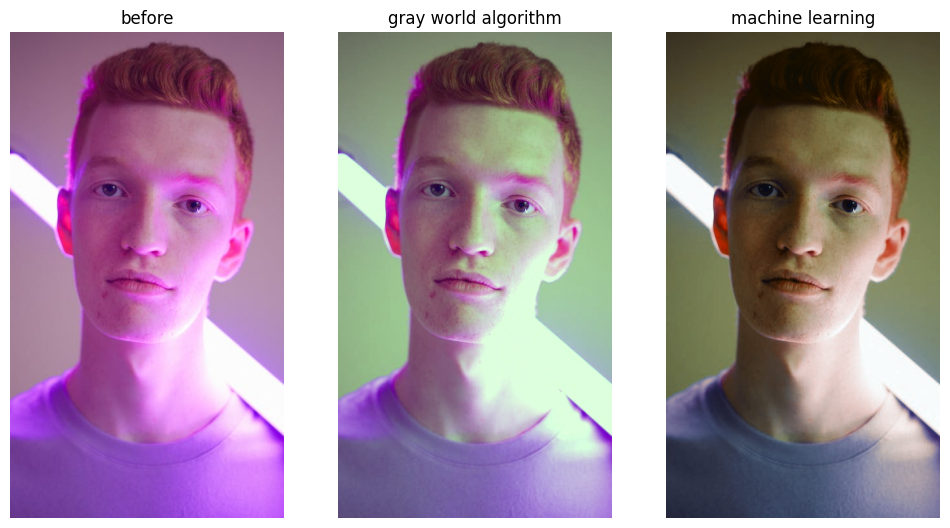

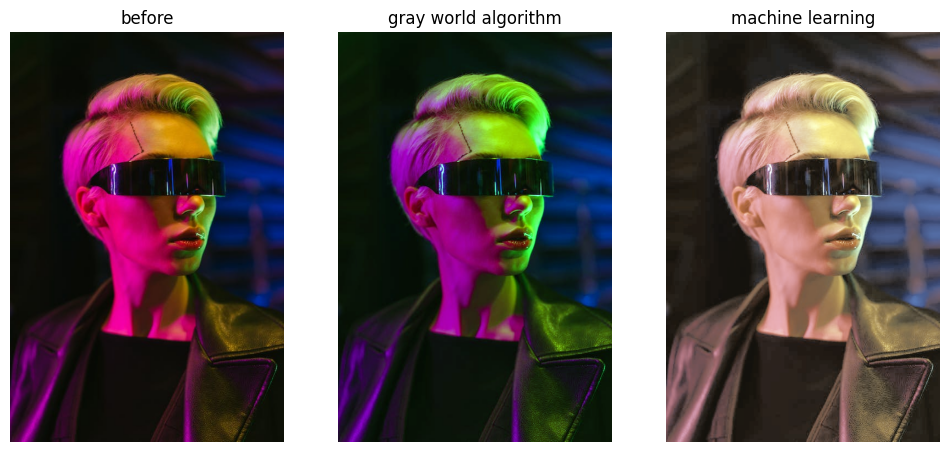

### Faces

Faces are the bane of all color / exposure algorithms. As humans, we are extremely sensitive to faces that look "too neutral", which appear zombie like. In other words, we want neutral colors in an image, unless it's a face: then we want warmer colors. This is another strength of machine learning: we can tune our algorithm to make faces appear vivid and healthy. Below are two faces that are well-balanced by "gray world" algorithms, but that look better with a warmer face tone.

Note: overall these faces look nicer than the ones above, because there's more color information about their true skin tone. In the above images, that's largely washed out by the intense highlights.

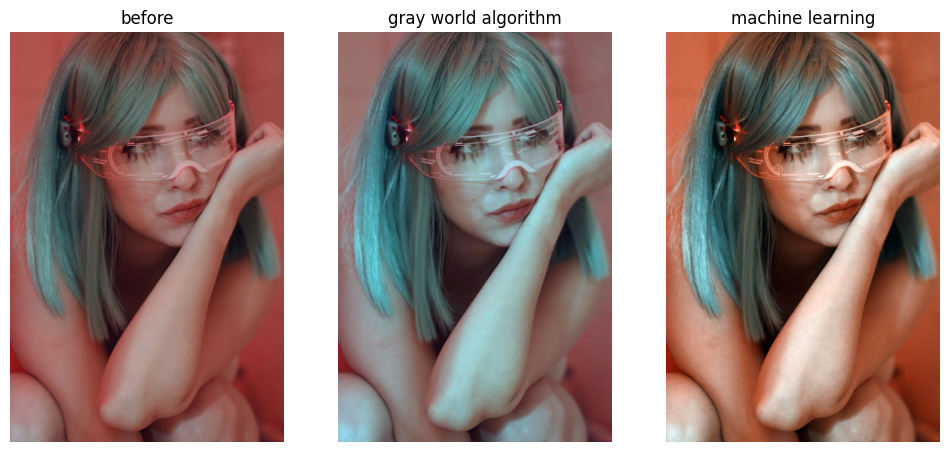

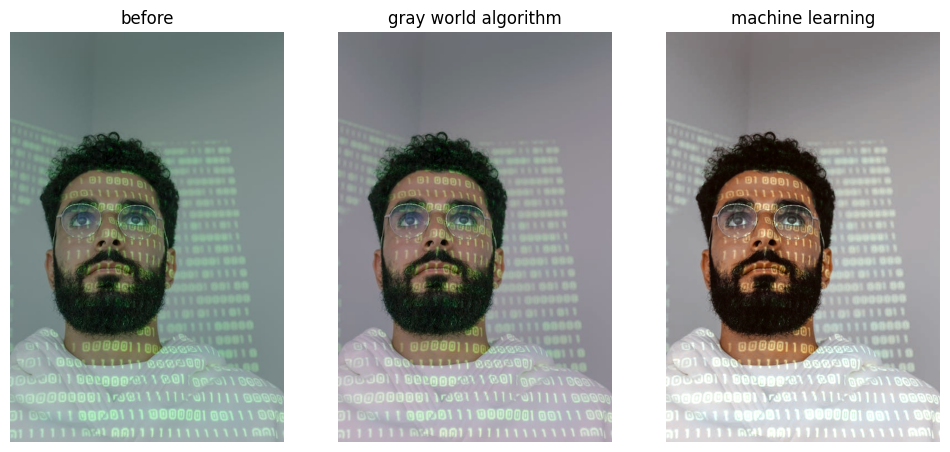

### Instagram / Postprocessing Filters

It's actually easy to remove VSCO and Instagram-like filters with machine learning because the original photo usually contains all the necessary information about the true colors (the original image was likely a good photo to begin with). There are also simple ways of generating datasets that can be used for this purpose. Removing real-world photographic distortions, on the otherhand, can be more difficult to remove because the underlying data was damaged by bad lighting before it reached the sensor.

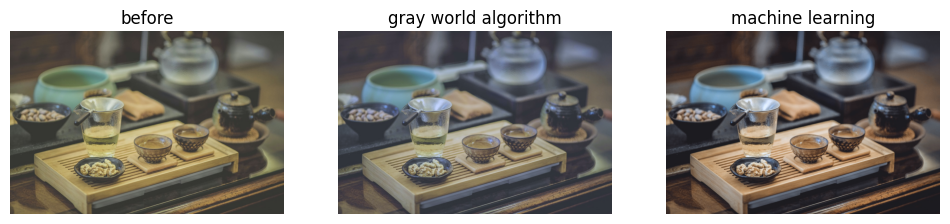